## Project Planning

This a Machine Learning Project. The dataset that we are using in this Project is from Indian Airline. Dataset contains the records of fligts on one year from different Airlines with thei fare price.

What we have to do? We have to make a machine learning model that can predict the fares depending upon the different values like Airline, Route etc. So before making model we have to prepare/preprocess data to convert it into usable form for model.

## Importing Relavant Libraries

In [101]:
import numpy as np
import pandas as pd
import seaborn as sns
from scipy import stats
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
%matplotlib inline

In [102]:
pd.set_option('display.max_rows', None) 

In [103]:
# Code to ignore warnings
import warnings
warnings.simplefilter(action="ignore")

## Reading Dataset

In [104]:
import openpyxl
from pathlib import Path

xlsx_file = Path('Data_Train.xlsx')
wb_obj = openpyxl.load_workbook(xlsx_file)
 

In [105]:
df = pd.read_excel (r'Data_Train.xlsx')
df.head()

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price
0,IndiGo,24/03/2019,Banglore,New Delhi,BLR → DEL,22:20,01:10 22 Mar,2h 50m,non-stop,No info,3897
1,Air India,1/05/2019,Kolkata,Banglore,CCU → IXR → BBI → BLR,05:50,13:15,7h 25m,2 stops,No info,7662
2,Jet Airways,9/06/2019,Delhi,Cochin,DEL → LKO → BOM → COK,09:25,04:25 10 Jun,19h,2 stops,No info,13882
3,IndiGo,12/05/2019,Kolkata,Banglore,CCU → NAG → BLR,18:05,23:30,5h 25m,1 stop,No info,6218
4,IndiGo,01/03/2019,Banglore,New Delhi,BLR → NAG → DEL,16:50,21:35,4h 45m,1 stop,No info,13302


In [106]:
print("Shape of Data is ",df.shape)

Shape of Data is  (10683, 11)


In [107]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10683 entries, 0 to 10682
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   Airline          10683 non-null  object
 1   Date_of_Journey  10683 non-null  object
 2   Source           10683 non-null  object
 3   Destination      10683 non-null  object
 4   Route            10682 non-null  object
 5   Dep_Time         10683 non-null  object
 6   Arrival_Time     10683 non-null  object
 7   Duration         10683 non-null  object
 8   Total_Stops      10682 non-null  object
 9   Additional_Info  10683 non-null  object
 10  Price            10683 non-null  int64 
dtypes: int64(1), object(10)
memory usage: 918.2+ KB


## Data Preprocessing

In [108]:
# Statistics of data like missing values, type, unique values etc
statistics_of_data = []
for col in df.columns:
  statistics_of_data.append((col,
                             df[col].nunique(),
                             df[col].isnull().sum()*100/df.shape[0],
                             df[col].value_counts(normalize=True, dropna=False).values[0] * 100, 
                             df[col].dtype
                             ))
stats_df = pd.DataFrame(statistics_of_data, columns=['Feature', 'Uniq_val', 'missing_val', 'val_biggest_cat', 'type'])

In [109]:
stats_df.sort_values('missing_val', ascending=False)

,Feature,Uniq_val,missing_val,val_biggest_cat,type
4,Route,128,0.009361,22.240944,object
8,Total_Stops,5,0.009361,52.653749,object
0,Airline,12,0.000000,36.029205,object
1,Date_of_Journey,44,0.000000,4.717776,object
2,Source,5,0.000000,42.469344,object
3,Destination,6,0.000000,42.469344,object
5,Dep_Time,222,0.000000,2.181035,object
6,Arrival_Time,1343,0.000000,3.959562,object
7,Duration,368,0.000000,5.148367,object
9,Additional_Info,10,0.000000,78.114762,object


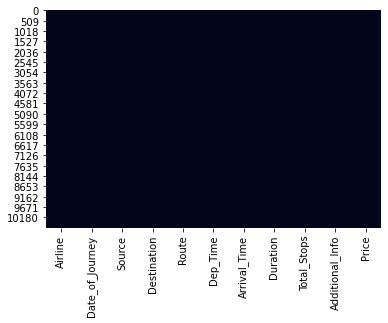

In [110]:
sns.heatmap(df.isnull(), cbar=False)
plt.show()

There are only two missing two missing values in whole dataset. So dropping will not make any effect on data.

In [111]:
# Dropping Null values
df.dropna(inplace=True)

## Exploratory Data Analysis

In [112]:
# Changing default figure size of matplotlib graph
from matplotlib.pylab import rcParams
rcParams["figure.figsize"]=(14, 8)

In [113]:
# Function to show percentage on bars
def per_on_bar(plot,feature):
    total = len(feature)
    for p in plot.patches:
        percentage = '{:.1f}%'.format(100 * p.get_height()/total)
        x = p.get_x() + p.get_width() / 2 - 0.08
        y = p.get_y() + p.get_height()
        ax.annotate(percentage, (x, y), size = 12)
    plt.show()

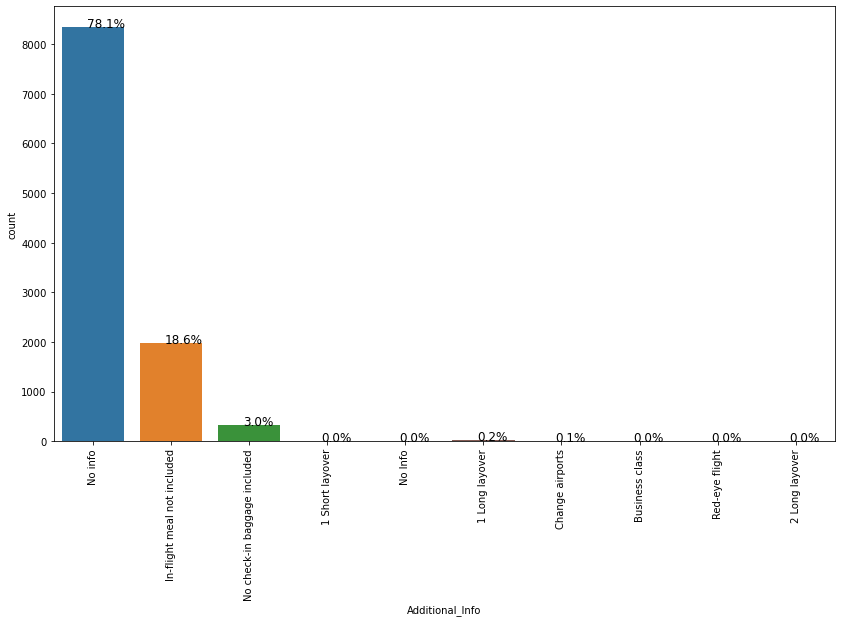

In [114]:
plt.xticks(rotation=90)
ax = sns.countplot(df.Additional_Info)
per_on_bar(ax, df.Additional_Info)

For most of the flights there was no detail provided.

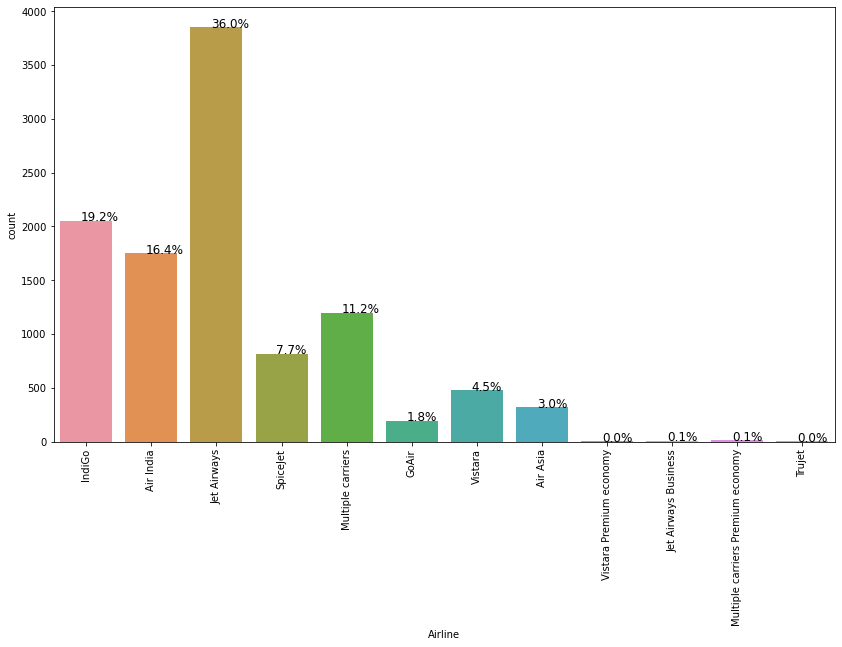

In [115]:
plt.xticks(rotation=90)
ax = sns.countplot(df.Airline)
per_on_bar(ax, df.Airline)

We can see Jet Airways is the top Airline Company who make more flights Take Off.

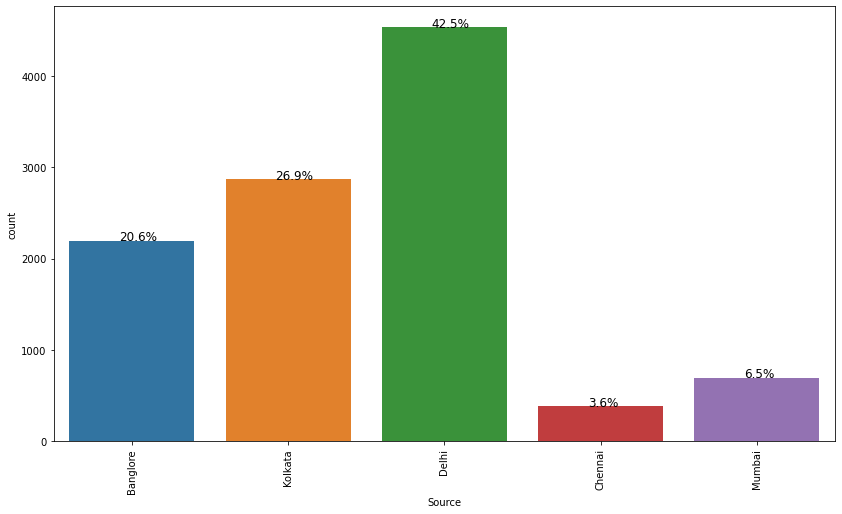

In [116]:
plt.xticks(rotation=90)
ax = sns.countplot(df.Source)
per_on_bar(ax, df.Source)

Most of the Flights were Take Off from **Delhi** state in india.

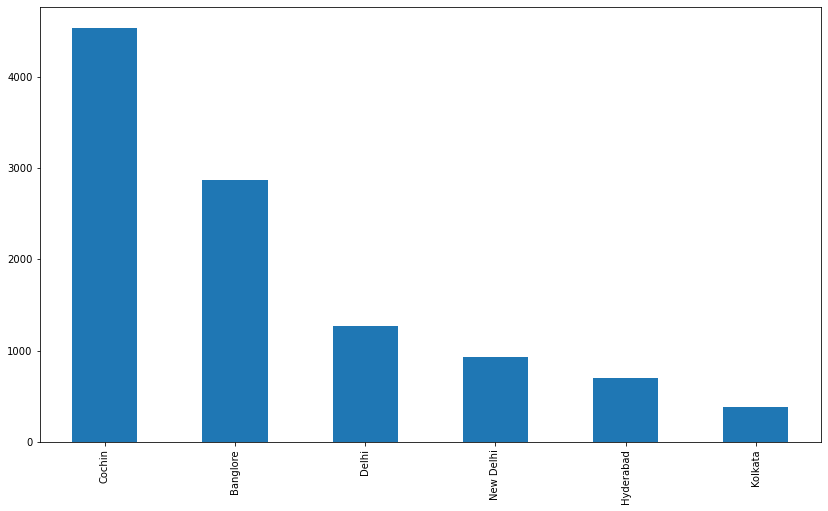

In [117]:
df['Destination'].value_counts().plot(kind='bar')
plt.show()

Most flights were having destination to **Cochin** city.

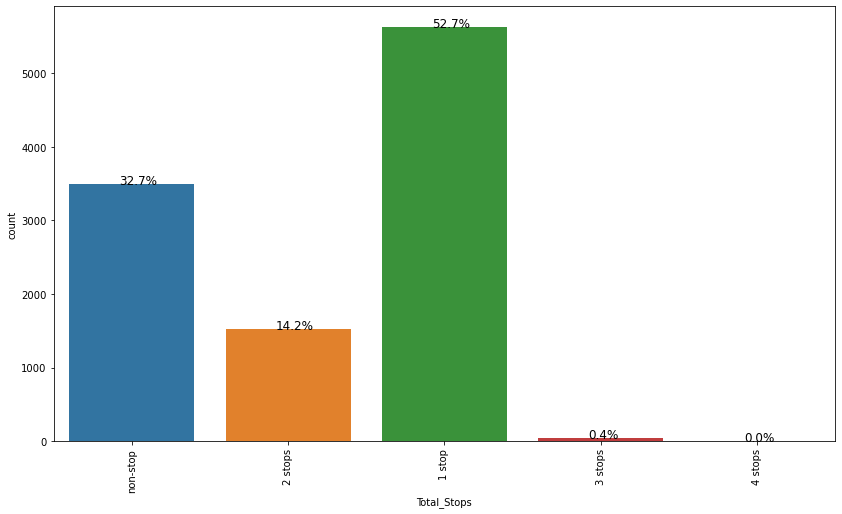

In [118]:
plt.xticks(rotation=90)
ax = sns.countplot(df.Total_Stops)
per_on_bar(ax, df.Total_Stops)

Almost **53%** flights make only one stop during their journey.

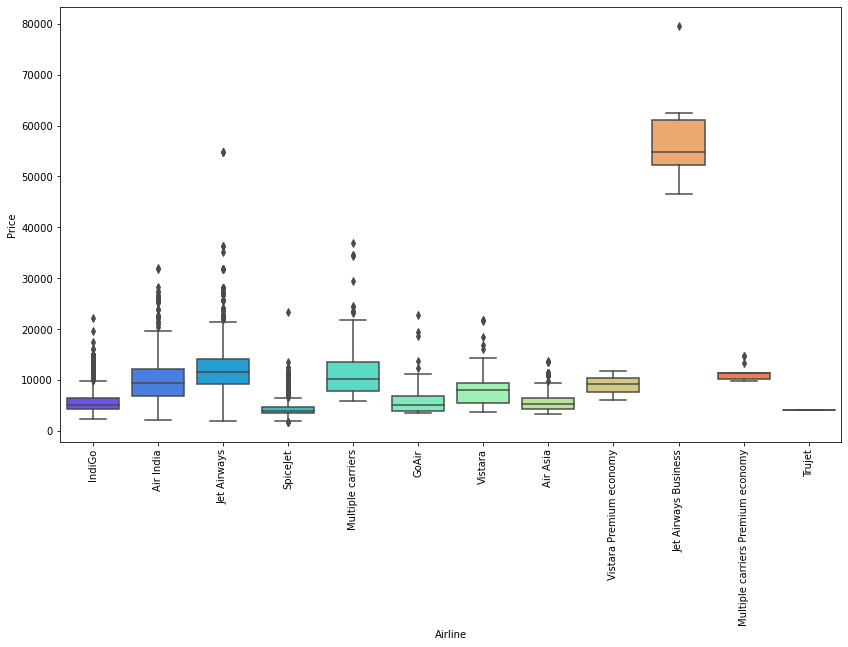

In [119]:
plt.xticks(rotation=90)
sns.boxplot(x='Airline',y='Price',data=df,palette='rainbow')
plt.show()

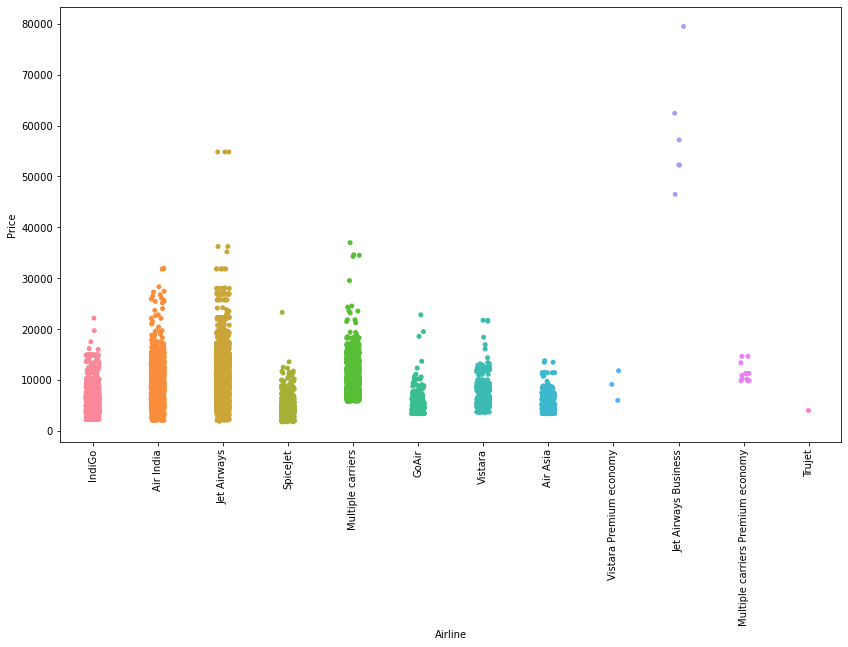

In [120]:
plt.xticks(rotation=90)
sns.stripplot(x="Airline", y="Price", data=df)
plt.show()

Last 2 graphs shows the distribution of Fare with respect to Airlines. And we can see that the fare range of almost all Airlines is between 1000 to 30000.

Date feature is not in proper format. We have to make it in some proper format. So, let's do it.

In [121]:
# convert the 'Date' column to datetime format
df['Date']= pd.to_datetime(df['Date_of_Journey'])

In [122]:
# Converting the date into year, month, day
df['year']= df['Date'].dt.year
df['month']= df['Date'].dt.month
df['day']= df['Date'].dt.day
df.head()

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price,Date,year,month,day
0,IndiGo,24/03/2019,Banglore,New Delhi,BLR → DEL,22:20,01:10 22 Mar,2h 50m,non-stop,No info,3897,2019-03-24,2019,3,24
1,Air India,1/05/2019,Kolkata,Banglore,CCU → IXR → BBI → BLR,05:50,13:15,7h 25m,2 stops,No info,7662,2019-01-05,2019,1,5
2,Jet Airways,9/06/2019,Delhi,Cochin,DEL → LKO → BOM → COK,09:25,04:25 10 Jun,19h,2 stops,No info,13882,2019-09-06,2019,9,6
3,IndiGo,12/05/2019,Kolkata,Banglore,CCU → NAG → BLR,18:05,23:30,5h 25m,1 stop,No info,6218,2019-12-05,2019,12,5
4,IndiGo,01/03/2019,Banglore,New Delhi,BLR → NAG → DEL,16:50,21:35,4h 45m,1 stop,No info,13302,2019-01-03,2019,1,3


In [123]:
# we are droping year columns because its data of only one year that's for it we dont need to be analyze this
df.drop('year',
  axis='columns', inplace=True)

In [124]:
#Mapping of Total_Stops
titlemapping = {'non-stop':0, '1 stop':1,'2 stop':2, '3 stop':3,'4 stop':4}
 
     
df["Total_Stops"] = df["Total_Stops"].map(titlemapping)
df['Total_Stops'] = df['Total_Stops'].fillna(0)
df['Total_Stops'] = df['Total_Stops'].astype(int)
    

In [125]:
train_data = df.copy()

In [126]:
# Dealing with route data
train_data['Route_1']=''
train_data['Route_2']=''
train_data['Route_3']=''
train_data['Route_4']=''
train_data['Route_5']=''
 

train_data['Route_1']=train_data['Route'].str.split('→ ').str[0]
train_data['Route_2']=train_data['Route'].str.split('→ ').str[1]
train_data['Route_3']=train_data['Route'].str.split('→ ').str[2]
train_data['Route_4']=train_data['Route'].str.split('→ ').str[3]
train_data['Route_5']=train_data['Route'].str.split('→ ').str[4]

train_data.head()

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price,Date,month,day,Route_1,Route_2,Route_3,Route_4,Route_5
0,IndiGo,24/03/2019,Banglore,New Delhi,BLR → DEL,22:20,01:10 22 Mar,2h 50m,0,No info,3897,2019-03-24,3,24,BLR,DEL,NaN,NaN,NaN
1,Air India,1/05/2019,Kolkata,Banglore,CCU → IXR → BBI → BLR,05:50,13:15,7h 25m,0,No info,7662,2019-01-05,1,5,CCU,IXR,BBI,BLR,NaN
2,Jet Airways,9/06/2019,Delhi,Cochin,DEL → LKO → BOM → COK,09:25,04:25 10 Jun,19h,0,No info,13882,2019-09-06,9,6,DEL,LKO,BOM,COK,NaN
3,IndiGo,12/05/2019,Kolkata,Banglore,CCU → NAG → BLR,18:05,23:30,5h 25m,1,No info,6218,2019-12-05,12,5,CCU,NAG,BLR,NaN,NaN
4,IndiGo,01/03/2019,Banglore,New Delhi,BLR → NAG → DEL,16:50,21:35,4h 45m,1,No info,13302,2019-01-03,1,3,BLR,NAG,DEL,NaN,NaN


In [127]:
train_data.replace(np.nan, "None")

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price,Date,month,day,Route_1,Route_2,Route_3,Route_4,Route_5
0,IndiGo,24/03/2019,Banglore,New Delhi,BLR → DEL,22:20,01:10 22 Mar,2h 50m,0,No info,3897,2019-03-24,3,24,BLR,DEL,None,None,None
1,Air India,1/05/2019,Kolkata,Banglore,CCU → IXR → BBI → BLR,05:50,13:15,7h 25m,0,No info,7662,2019-01-05,1,5,CCU,IXR,BBI,BLR,None
2,Jet Airways,9/06/2019,Delhi,Cochin,DEL → LKO → BOM → COK,09:25,04:25 10 Jun,19h,0,No info,13882,2019-09-06,9,6,DEL,LKO,BOM,COK,None
3,IndiGo,12/05/2019,Kolkata,Banglore,CCU → NAG → BLR,18:05,23:30,5h 25m,1,No info,6218,2019-12-05,12,5,CCU,NAG,BLR,None,None
4,IndiGo,01/03/2019,Banglore,New Delhi,BLR → NAG → DEL,16:50,21:35,4h 45m,1,No info,13302,2019-01-03,1,3,BLR,NAG,DEL,None,None
5,SpiceJet,24/06/2019,Kolkata,Banglore,CCU → BLR,09:00,11:25,2h 25m,0,No info,3873,2019-06-24,6,24,CCU,BLR,None,None,None
6,Jet Airways,12/03/2019,Banglore,New Delhi,BLR → BOM → DEL,18:55,10:25 13 Mar,15h 30m,1,In-flight meal not included,11087,2019-12-03,12,3,BLR,BOM,DEL,None,None
7,Jet Airways,01/03/2019,Banglore,New Delhi,BLR → BOM → DEL,08:00,05:05 02 Mar,21h 5m,1,No info,22270,2019-01-03,1,3,BLR,BOM,DEL,None,None
8,Jet Airways,12/03/2019,Banglore,New Delhi,BLR → BOM → DEL,08:55,10:25 13 Mar,25h 30m,1,In-flight meal not included,11087,2019-12-03,12,3,BLR,BOM,DEL,None,None
9,Multiple carriers,27/05/2019,Delhi,Cochin,DEL → BOM → COK,11:25,19:15,7h 50m,1,No info,8625,2019-05-27,5,27,DEL,BOM,COK,None,None


In [128]:
train_data[['Duration','Price']].groupby(['Duration'],as_index = False).mean().sort_values(by = 'Price',ascending = False)

,Duration,Price
42,13h 35m,22294.000000
272,37h 10m,21314.000000
294,47h 40m,20694.000000
293,47h,20064.000000
268,35h 35m,19907.000000
133,20h 5m,19252.000000
105,18h 55m,19030.500000
283,3h 25m,18797.000000
253,31h 50m,17926.000000
227,29h 30m,17686.000000


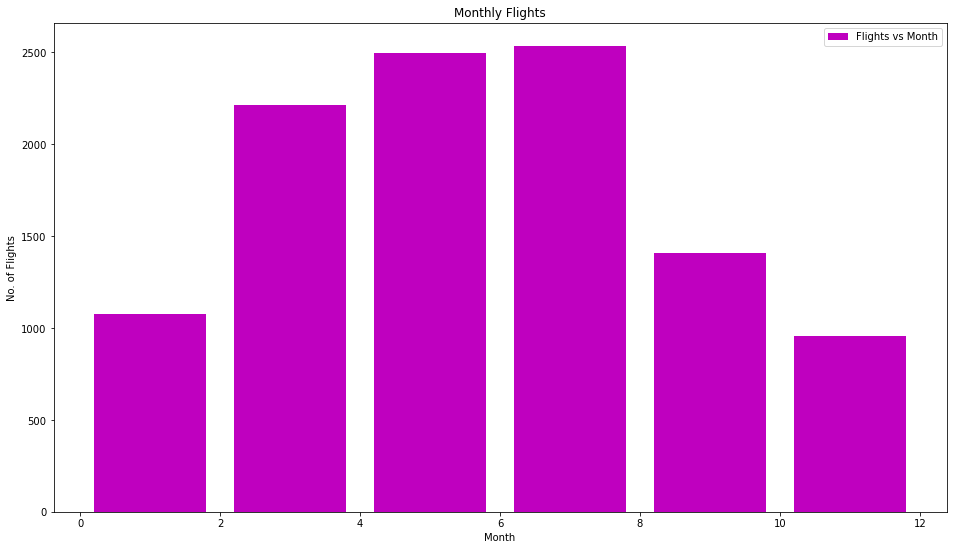

In [129]:
bins = [0,2,4,6,8,10,12]
plt.figure(figsize = (16,9))
 

plt.hist(df['month'], bins, rwidth=0.8, histtype = "bar",
         orientation='vertical', color = "m", label = "Flights vs Month")
plt.title("Monthly Flights")
plt.xlabel("Month")
plt.ylabel("No. of Flights")
plt.legend()
plt.show()

By this graph we can extract one more insight that most of flights took off in month 5, 6, 7. That's mean mostly people travel in 5, 6, 7 month.

## Feature Engineering

In [130]:
# We are deleting Date of Journey ,Dep_Time, Arrival_Time, bcz we don't need of these columns bcz these columns are not required for predicting the price 
# price is our feature mean target column or predicted column
  
train_data = train_data.drop(['Duration','Dep_Time','Arrival_Time','Route','Date'], axis=1)
  
train_data.head()

,Airline,Date_of_Journey,Source,Destination,Total_Stops,Additional_Info,Price,month,day,Route_1,Route_2,Route_3,Route_4,Route_5
0,IndiGo,24/03/2019,Banglore,New Delhi,0,No info,3897,3,24,BLR,DEL,NaN,NaN,NaN
1,Air India,1/05/2019,Kolkata,Banglore,0,No info,7662,1,5,CCU,IXR,BBI,BLR,NaN
2,Jet Airways,9/06/2019,Delhi,Cochin,0,No info,13882,9,6,DEL,LKO,BOM,COK,NaN
3,IndiGo,12/05/2019,Kolkata,Banglore,1,No info,6218,12,5,CCU,NAG,BLR,NaN,NaN
4,IndiGo,01/03/2019,Banglore,New Delhi,1,No info,13302,1,3,BLR,NAG,DEL,NaN,NaN


In [131]:
train_data.replace(np.nan, "None")
nomi = train_data.copy()

In [132]:
#So We will Use Label Encoder
from sklearn.preprocessing import LabelEncoder
encoder=LabelEncoder()  

In [133]:
# Encoding categorical data to integer values
train_data["Airline"]=encoder.fit_transform(train_data['Airline'])
train_data["Source"]=encoder.fit_transform(train_data['Source'])
train_data["Destination"]=encoder.fit_transform(train_data['Destination'])
train_data["Additional_Info"]=encoder.fit_transform(train_data['Additional_Info'])
train_data["Route_1"]=encoder.fit_transform(train_data['Route_1'])
train_data["Route_2"]=encoder.fit_transform(train_data['Route_2'])
train_data["Route_3"]=encoder.fit_transform(train_data['Route_3'])
train_data["Route_4"]=encoder.fit_transform(train_data['Route_4'])
train_data["Route_5"]=encoder.fit_transform(train_data['Route_5'])

In [134]:
train_data.head(3)

,Airline,Date_of_Journey,Source,Destination,Total_Stops,Additional_Info,Price,month,day,Route_1,Route_2,Route_3,Route_4,Route_5
0,3,24/03/2019,0,5,0,8,3897,3,24,0,13,29,13,5
1,1,1/05/2019,3,0,0,8,7662,1,5,2,25,1,3,5
2,4,9/06/2019,2,1,0,8,13882,9,6,3,32,4,5,5


In [135]:
labeled_df = train_data.copy()

## Model Building

In [136]:
# Importing Libraries that will be used for model evaluation
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import cross_val_score
from sklearn.neighbors import KNeighborsRegressor
from sklearn.linear_model import LinearRegression

In [137]:
# Arrays to store model performace
model = []
acc = []

In [138]:
# Separating data into Dependent and Independent
labeled_df.dropna(inplace=True)
x = labeled_df.drop(["Date_of_Journey", "Price"], axis=1)
y = labeled_df["Price"]

In [139]:
# Spliting data into Train Test
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=20)

#### 1) Linear Regression Model

In [140]:
# Training Linear Regression model on train data
lr = LinearRegression()
lr.fit(x_train, y_train)
score = round(lr.score(x_test, y_test)*100, 2)
model.append("Linear Regression")
acc.append(score)
print("Linear Model Accuracy is ", score, "%")

Linear Model Accuracy is  47.17 %


#### 2) K-Neighbour Model

In [141]:
# Training KNN Regression model on train data
knn = KNeighborsRegressor()
knn.fit(x_train, y_train)
score = round(knn.score(x_test, y_test)*100, 2)
model.append("KNeighbors Regressor")
acc.append(score)
print("KNeighborsRegressor Model Accuracy is ", score, "%")

KNeighborsRegressor Model Accuracy is  76.38 %


#### 3) Decision Tree Model

In [142]:
# Training Decision Tree Regression model on train data
dtc = DecisionTreeRegressor()
dtc.fit(x_train, y_train)
score = round(dtc.score(x_test, y_test)*100, 2)
model.append("Decision Tree Regressor")
acc.append(score)
print("Decision Tree Model Accuracy is ", score, "%")

Decision Tree Model Accuracy is  83.45 %


#### 4) Random Forest Model

In [143]:
# Training Random Forest Regression model on train data
rf = KNeighborsRegressor()
rf.fit(x_train, y_train)
score = round(rf.score(x_test, y_test)*100, 2)
model.append("Random Forest Regressor")
acc.append(score)
print("Random Forest Regressor Model Accuracy is ", score, "%")

Random Forest Regressor Model Accuracy is  76.38 %


## Models Comparison

In [144]:
comp = pd.DataFrame({"Model": model, "Accuracy": acc})
comp

,Model,Accuracy
0,Linear Regression,47.17
1,KNeighbors Regressor,76.38
2,Decision Tree Regressor,83.45
3,Random Forest Regressor,76.38


From this comparison we can see that Decision Tree model is performing better than any other model. So, we will finalize this model for our further procedure.

## Prediction

Let's make some predictions for test data with our finalized model Decision Tree

In [145]:
y_pred = map(round, list(dtc.predict(x_test)))

pd.DataFrame({"Original Values": y_test, "Predicted Values": y_pred}).head(10)

,Original Values,Predicted Values
5544,12898,12654
4063,10577,10351
5254,7646,8417
5775,14781,14513
3204,6643,8204
4230,4823,4306
4016,9314,9872
3111,27992,28636
5185,17549,16004
7228,4544,5124


We can see that there is much difference between predicted and original values. That's mean our performing better.

# Conclusion

Project was to predict the fare of different airlines. So for that first of we read the data. Dataset was having more 10,000 records. That was not clean. There were some missing values that have bean dropped. Then we Performed Visualization to get interesting insights from data. These insights are written under every graph.

After that we performed Feature Engineering to encode them to integer values and to select best one from them.

Then that, it was time to built the model. We prepared and fit 4 models to find best one. And we can see Decision Tree was performing much better than other models. It was giving accuracy around 85% that is an ideal accuracy in case of regression. So finalized model is Decision Tree.

In end to test model we also made some predictions and results are very close to original values.